In [1]:
from main import return_trainer
import numpy as np
import matplotlib.pyplot as plt
import torch

/home/lenny/miniconda3/envs/model/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


cuda available? :  True


In [2]:
# why can't I import _return_trainer from main?



In [20]:
%tb
trainer = return_trainer([
    '--model','mae',
    '--assets','/mnt/ssd2/Master/S2S_on_SFNO/Assets',
    '--trainingdata-path',"/mnt/V/wb2_2001-2003.zarr",
    '--resume-checkpoint',"/mnt/V/Master/checkpoints/summer-puddle-7/checkpoint_mae_latest_None_iter=423_epoch=2.pkl",
    '--trainingset-start-year','2001',
    '--trainingset-end-year','2002',
    '--validationset-start-year','2002',
    '--validationset-end-year','2003',
    '--loss-fn','NormalCRPS',
    '--loss-reduction','none',
    '--nan-mask-threshold','0.5',
    ])

No traceback available to show.


returning trainer
parameters of loaded checkpoint  /mnt/V/Master/checkpoints/summer-puddle-7/checkpoint_mae_latest_None_iter=423_epoch=2.pkl
 -- options
     assets  :  /mnt/ssd2/Master/S2S_on_SFNO/Assets
     assets_list  :  False
     assets_sub_directory  :  S2S_on_SFNO/Assets
     class_  :  None
     cpu  :  False
     expver  :  None
     fields  :  False
     film_gen_type  :  None
     film_weights  :  None
     help  :  None
     metadata  :  None
     model_args  :  None
     model_type  :  mae
     model_version  :  latest
     num_threads  :  1
     only_gpu  :  False
     path  :  None
     sfno_weights  :  None
     test  :  False

 -- Data and Data Sources
     archive_requests  :  None
     coarse_level  :  4
     download_assets  :  False
     file  :  None
     input  :  cds
     input_store  :  None
     json  :  False
     requests_extra  :  None
     retrieve_requests  :  False

 -- Inference Parameters
     date  :  -1
     dump_provenance  :  False
     hindcast_

In [21]:
checkpoint_list = ["/mnt/V/Master/checkpoints/summer-puddle-7/checkpoint_mae_latest_None_iter=423_epoch=2.pkl"]
checkpoint_list = ["/mnt/V/Master/checkpoints/summer-puddle-7/checkpoint_mae_latest_None_iter=423_epoch=1.pkl"]
trainer.set_dataloader()
trainer.util.load_statistics()
trainer.util.set_seed(42)  
trainer.create_loss()


Trainig Data:
Using years:  2001  -  2002  (total length:  1459 ) (availabe date range:  1959 - 2023 )

Validation Data:
Using years:  2002  -  2003  (total length:  1459 ) (availabe date range:  1959 - 2023 )

Random seed set as 42


In [22]:
with torch.no_grad():
    for cp_idx, checkpoint in enumerate(checkpoint_list):
        cp = trainer.util.load_model(checkpoint)
        # trainer.save_path = save_path
        for i, data in enumerate(trainer.validation_loader):
            for step in range(trainer.cfg.multi_step_validation+1):
                data_nn = data[step][0].to(trainer.util.device)
                data_norm = trainer.util.normalise(data[step][0]).to(trainer.util.device)
                outputs, gt = trainer.model_forward(data_norm,data_norm,0)
                break
            break
        break

2024-05-10 21:44:29,797 INFO Using device 'CUDA'. The speed of inference depends greatly on the device.


In [23]:
def plot( data, gt, training_examples,checkpoint):
    """Plot data using matplotlib"""
    pred = data[0][0].cpu().numpy().squeeze()
    gt = gt.cpu().numpy().squeeze()
    std = data[0][1].cpu().numpy().squeeze()
    mask = data[1].cpu().numpy().squeeze()
    vmin = np.min(np.concatenate((pred[~np.isnan(pred)],gt[~np.isnan(gt)])))
    vmax = np.max(np.concatenate((pred[~np.isnan(pred)],gt[~np.isnan(gt)])))
    for time in range(pred.shape[0]):
        fig, ax = plt.subplots(2, 2, figsize=(10, 10))
        ax[0][0].imshow(pred[time],vmin=vmin, vmax=vmax,)
        ax[0][0].set_title("Predicted SST")
        im_gt = ax[0][1].imshow(gt[time],vmin=vmin, vmax=vmax,)
        ax[0][1].set_title("Ground Truth SST")
        ax[1][0].imshow(mask[time])
        ax[1][0].set_title("Mask")
        img_std = ax[1][1].imshow(std[time])
        ax[1][1].set_title("Predicted std")
        
        fig.colorbar(im_gt, ax=ax[0],shrink=0.7)
        fig.colorbar(img_std, ax=ax[1],shrink=0.7) 
        fig.suptitle("MAE reconstruction after ("+str(training_examples)+" training examples)")
        plt.show()

In [7]:

mu = torch.nan_to_num(outputs[0][0],nan=0.0)
std = torch.nan_to_num(outputs[0][1],nan=1.0)
mask = outputs[1][1]
gt[~mask] = 0.0
# remove nan values from loss


In [15]:
# plt.imshow(mask.cpu().numpy()[0,0,0])
# mask[0,0,0,100,100]
x = torch.tensor([1,1])
y = torch.ones_like(x,dtype=torch.bool)

In [16]:
y[1] = False

In [17]:
y

tensor([ True, False])

In [7]:
trainer.loss_fn(mu, std, gt) 


RuntimeError: The size of tensor a (1250704) must match the size of tensor b (360) at non-singleton dimension 4

In [24]:
loss = trainer.get_loss(outputs,gt)

In [30]:
print((~np.isnan(gt.cpu().numpy().squeeze())).sum())
print((~np.isnan(outputs[0][0].cpu().numpy().squeeze())).sum())
print((~np.isnan(data_norm.cpu().numpy().squeeze())).sum())

1264788
1194676
1264788


In [16]:
mask_th = outputs[1][1]

In [9]:
print(mask_th)

tensor([ True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True, False, False, False, False, False,  True,  True,
         True,  True, False, False,  True,  True, False, False, False, False,
        False, False, False, False, False, False, False, False, False, False,
         True,  True, False, False, False, False,  True, False, False, False,
         True,  True,  True,  True, False, False,  True,  True,  True,  True,
         True,  True,  True, False, False, False, False, False, 

In [15]:
mt = mask_th.expand(4,-1).T
mt

tensor([[ True,  True,  True,  True],
        [ True,  True,  True,  True],
        [ True,  True,  True,  True],
        ...,
        [False, False, False, False],
        [False, False, False, False],
        [False, False, False, False]], device='cuda:0')

In [25]:
mu = torch.nan_to_num(outputs[0][0],nan=0.0)
gt_l = torch.nan_to_num(gt,nan=0.0)
std = torch.nan_to_num(outputs[0][1],nan=1.0)
trainer.loss_fn(mu, std, gt) 

tensor(nan, device='cuda:0')

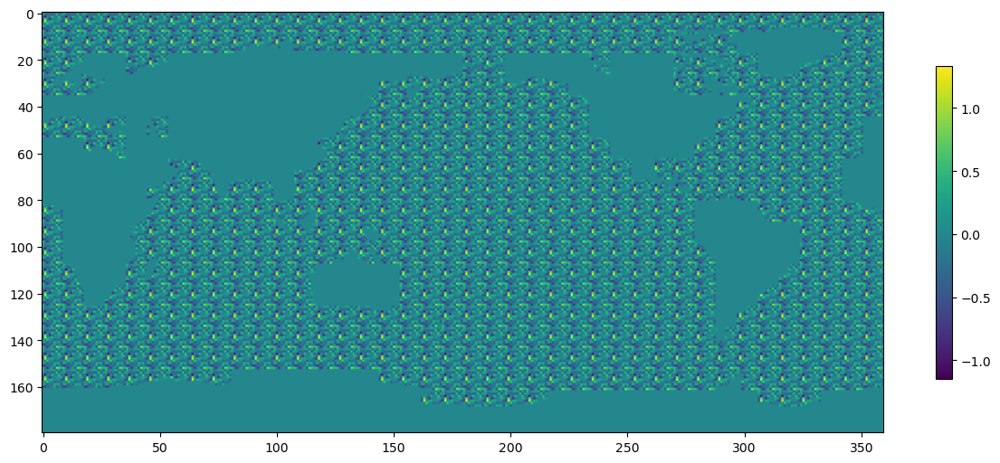

In [22]:
plt.figure(figsize=(15,15))
plt.imshow(mu[0][0].cpu().numpy().squeeze()[0])
plt.colorbar(shrink=0.3)

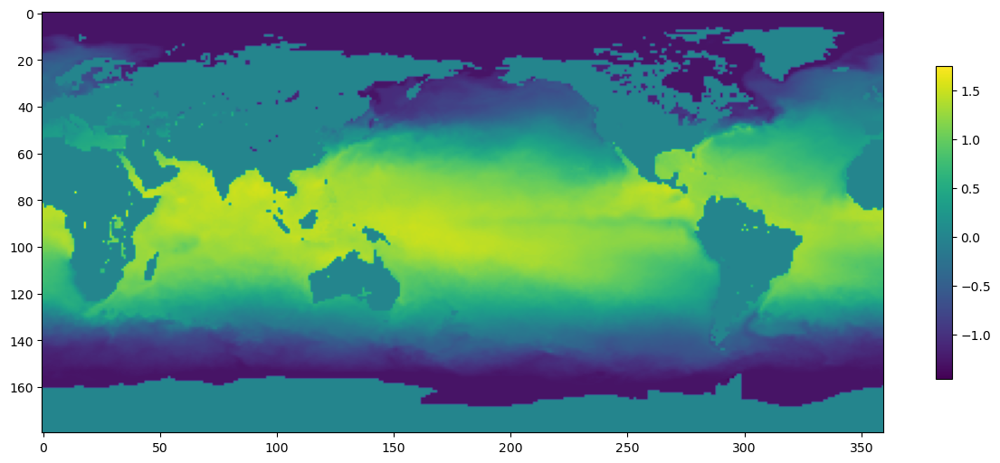

In [26]:
plt.figure(figsize=(15,15))
plt.imshow(gt_l[0][0].cpu().numpy().squeeze()[0])
plt.colorbar(shrink=0.3)

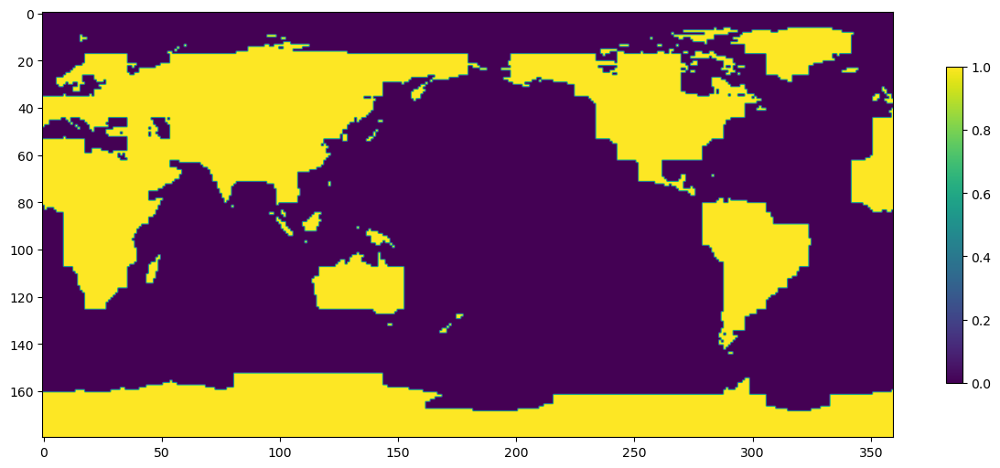

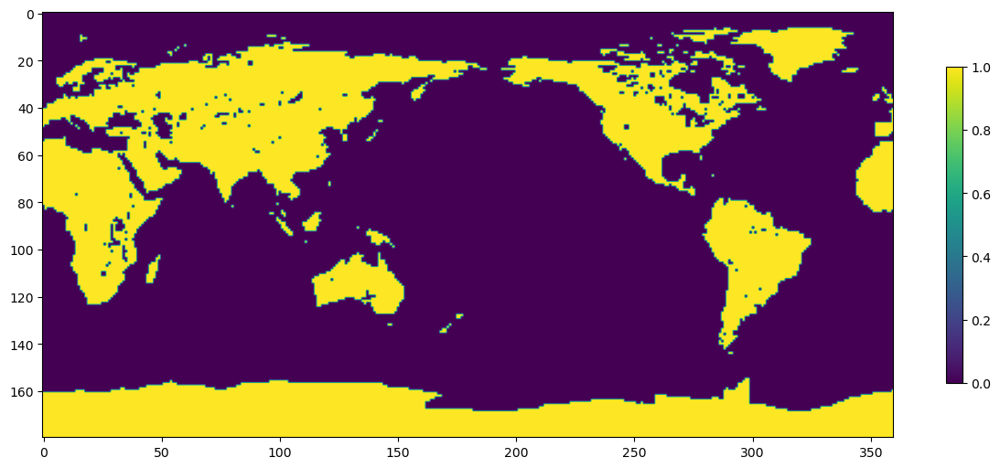

In [33]:
outputss = outputs[0][0] * 0.0
mu = torch.nan_to_num(outputss,nan=1.0)
gts = gt * 0.0
gt_l = torch.nan_to_num(gts,nan=1.0)
std = torch.nan_to_num(outputs[0][1],nan=1.0)
trainer.loss_fn(mu, std, gt) 

plt.figure(figsize=(15,15))
plt.imshow(mu[0][0].cpu().numpy().squeeze()[0])
plt.colorbar(shrink=0.3)

plt.figure(figsize=(15,15))
plt.imshow(gt_l[0][0].cpu().numpy().squeeze()[0])
plt.colorbar(shrink=0.3)

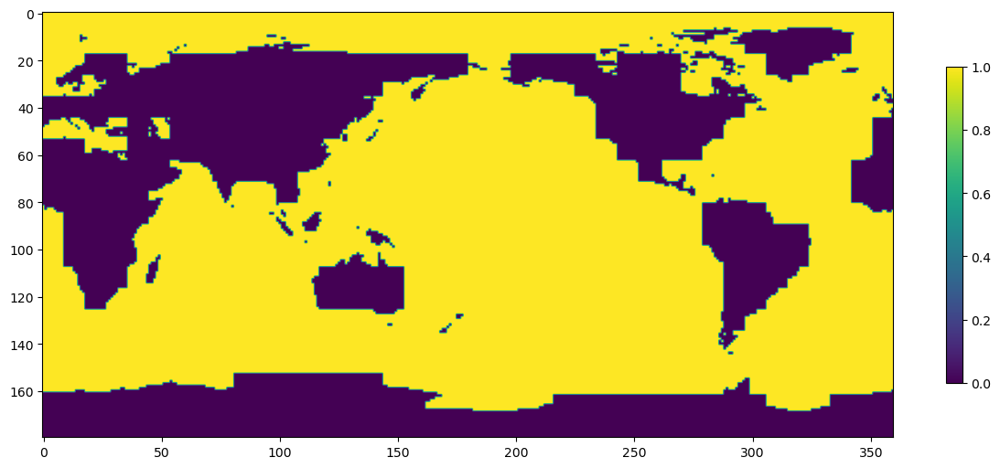

In [7]:
plt.figure(figsize=(15,15))
plt.imshow(mask_th[0,0,0].cpu().numpy())
plt.colorbar(shrink=0.3)


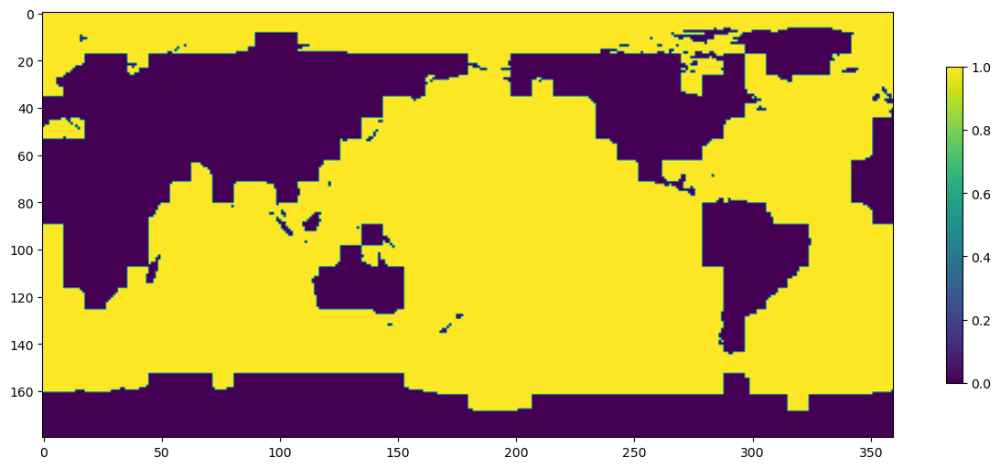

In [12]:
plt.figure(figsize=(15,15))
plt.imshow(mask_th[0,0,0].cpu().numpy())
plt.colorbar(shrink=0.3)

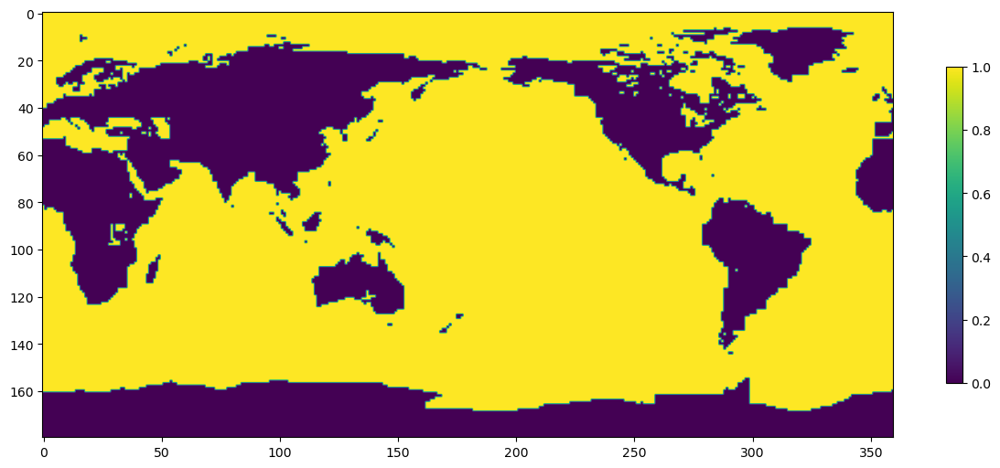

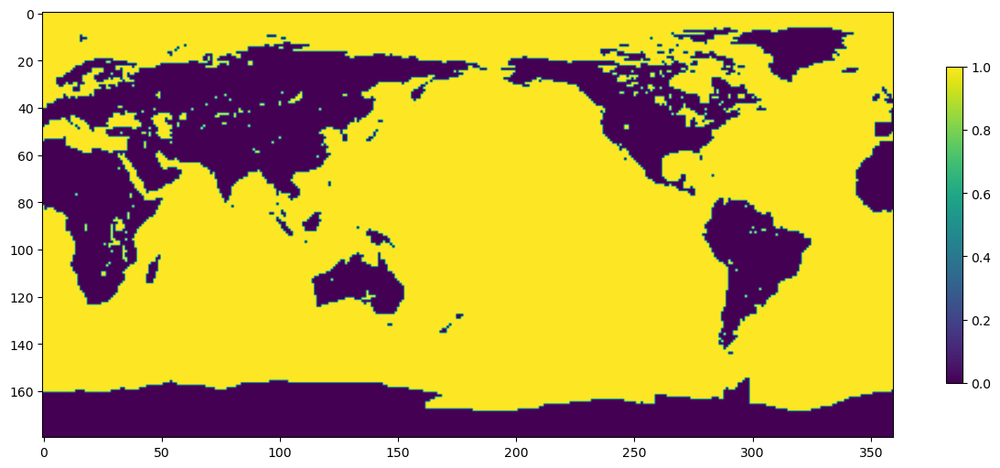

In [21]:
plt.figure(figsize=(15,15))
plt.imshow(mask_th[0,0,0].cpu().numpy())
plt.colorbar(shrink=0.3)


plt.figure(figsize=(15,15))
plt.imshow(~np.isnan(gt[0][0].cpu().numpy().squeeze()[0]))
plt.colorbar(shrink=0.3)

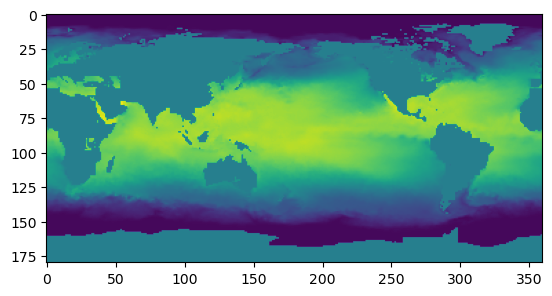

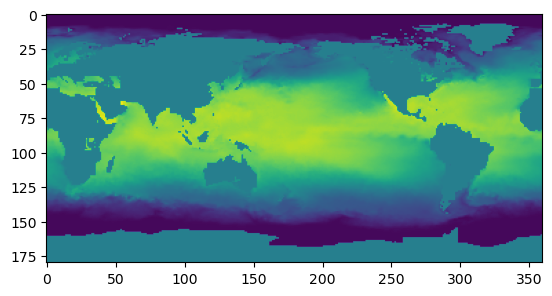

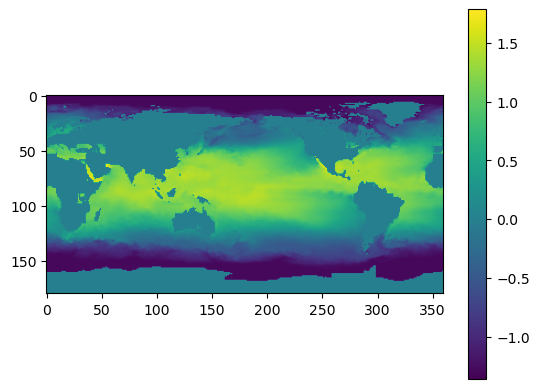

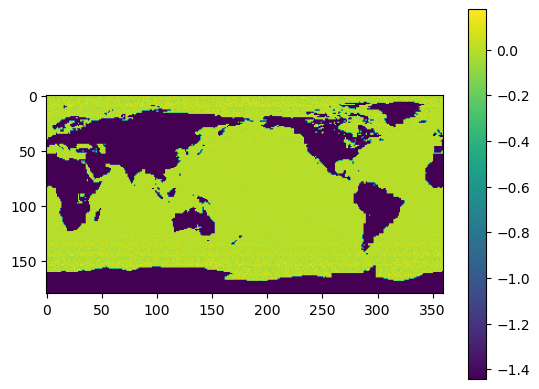

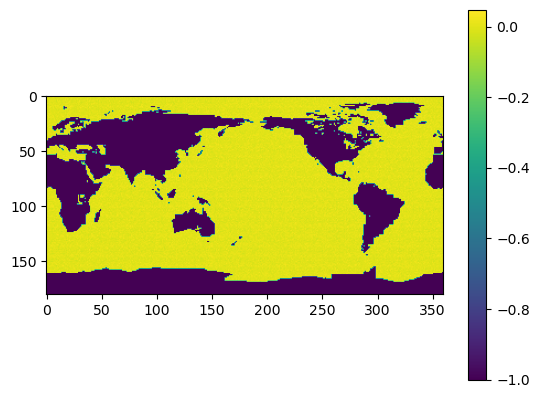

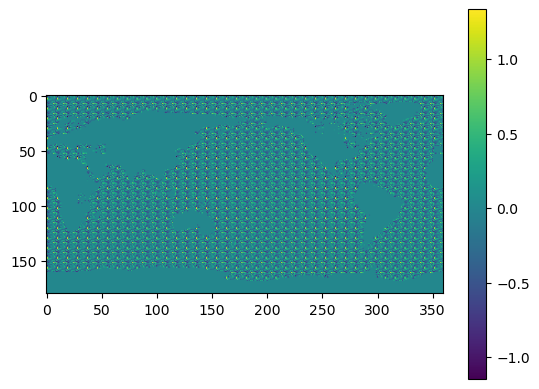

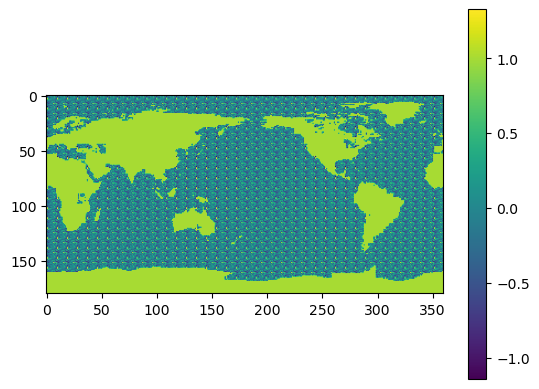

In [12]:

loss = trainer.get_loss(outputs,gt)

In [10]:
loss

tensor([[[[[   nan,    nan,    nan,  ...,    nan,    nan,    nan],
           [   nan,    nan,    nan,  ...,    nan,    nan,    nan],
           [   nan,    nan,    nan,  ...,    nan,    nan,    nan],
           ...,
           [0.3069, 0.3069, 0.3069,  ..., 0.3069, 0.3069, 0.3069],
           [0.3069, 0.3069, 0.3069,  ..., 0.3069, 0.3069, 0.3069],
           [0.3069, 0.3069, 0.3069,  ..., 0.3069, 0.3069, 0.3069]],

          [[   nan,    nan,    nan,  ...,    nan,    nan,    nan],
           [   nan,    nan,    nan,  ...,    nan,    nan,    nan],
           [   nan,    nan,    nan,  ...,    nan,    nan,    nan],
           ...,
           [0.3069, 0.3069, 0.3069,  ..., 0.3069, 0.3069, 0.3069],
           [0.3069, 0.3069, 0.3069,  ..., 0.3069, 0.3069, 0.3069],
           [0.3069, 0.3069, 0.3069,  ..., 0.3069, 0.3069, 0.3069]],

          [[   nan,    nan,    nan,  ...,    nan,    nan,    nan],
           [   nan,    nan,    nan,  ...,    nan,    nan,    nan],
           [   nan,    nan

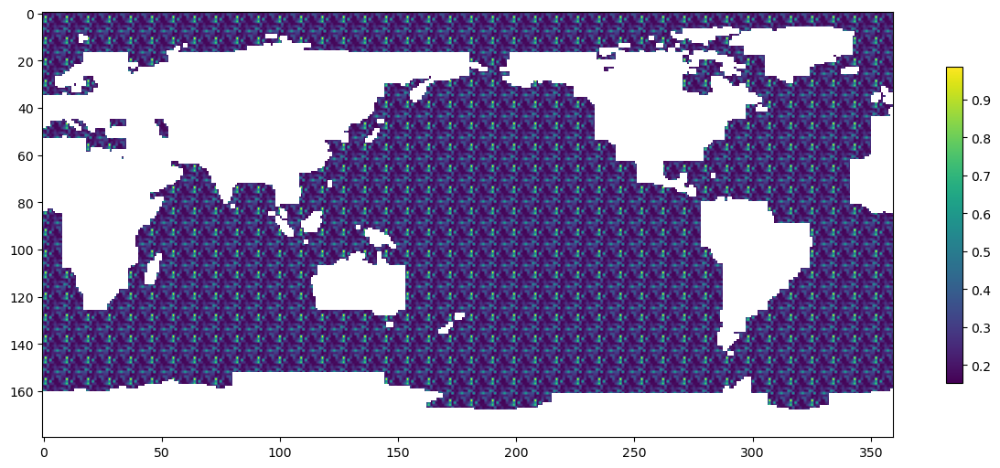

In [25]:
%matplotlib inline
plt.figure(figsize=(15,15))
plt.imshow(loss[0][0].cpu().numpy().squeeze()[0])
plt.colorbar(shrink=0.3)
plt.show()
# data[0][0].shape

In [10]:
loss[0][0].cpu().numpy().squeeze()[0][-1][10]

0.3069027

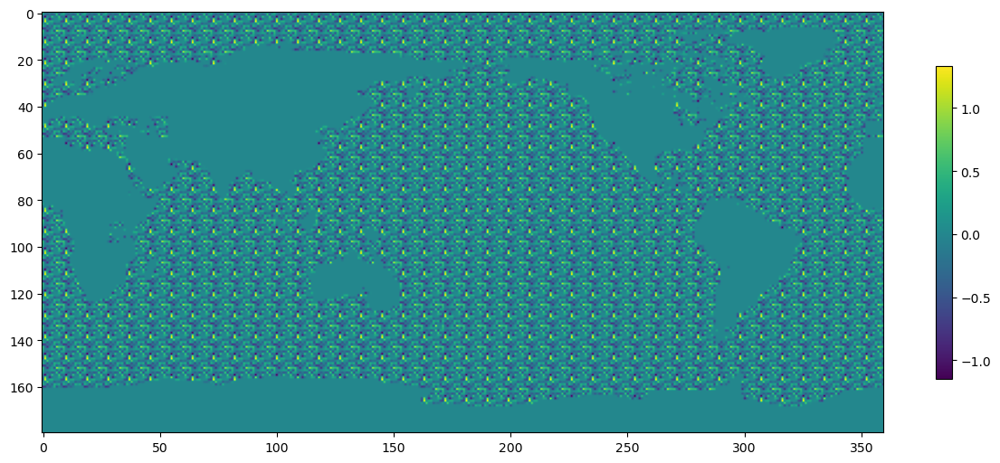

In [11]:

plt.figure(figsize=(15,15))
plt.imshow(torch.nan_to_num(outputs[0][0],nan=0.0).cpu().numpy().squeeze()[0])
plt.colorbar(shrink=0.3)
# data[0][0].shape

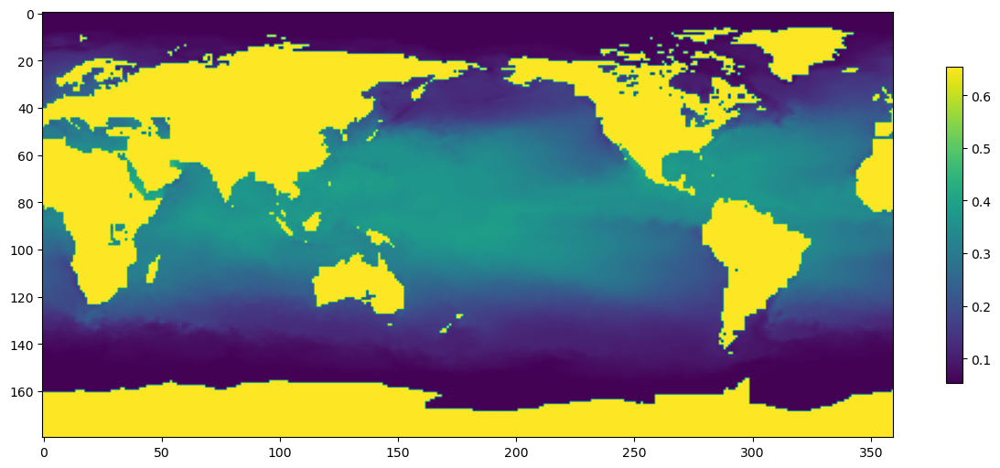

In [8]:


plt.figure(figsize=(15,15))
plt.imshow(loss[0][0].cpu().numpy().squeeze()[0])
plt.colorbar(shrink=0.3)
# data[0][0].shape

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(loss[0][0].cpu().numpy().squeeze()[0])
plt.colorbar(shrink=0.3)
# data[0][0].shape

In [42]:
# pred = outputs[0][0].cpu().numpy().squeeze()
# gts = gt.cpu().numpy().squeeze()

# print(np.min(np.concatenate((pred[~np.isnan(pred)],gts[~np.isnan(gts)]))))
# print(np.max(np.concatenate((pred[~np.isnan(pred)],gts[~np.isnan(gts)]))))
# print(np.min((gts[~np.isnan(gts)])))
# print(np.max((gts[~np.isnan(gts)])))

In [48]:
outputs[0][0].cpu().numpy().squeeze().shape

(28, 180, 360)

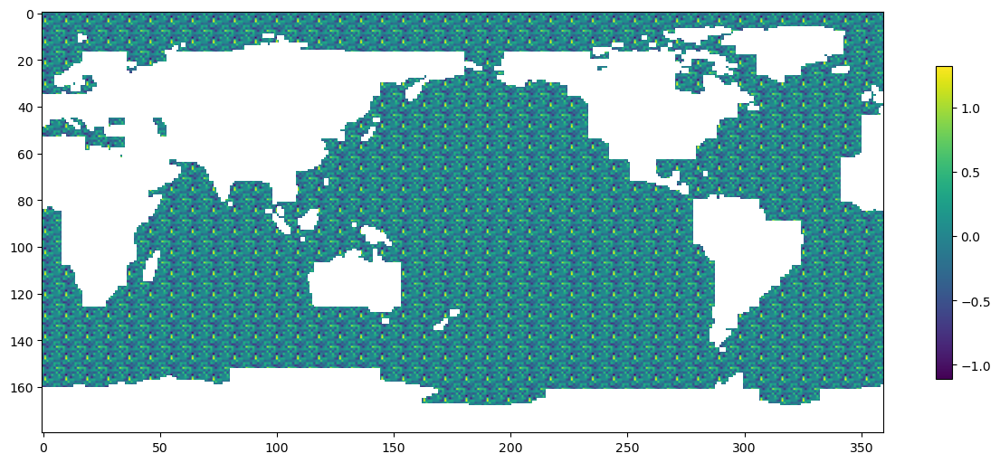

In [54]:
plt.figure(figsize=(15,15))
plt.imshow(outputs[0][0].cpu().numpy().squeeze()[0])
plt.colorbar(shrink=0.3)
# data[0][0].shape

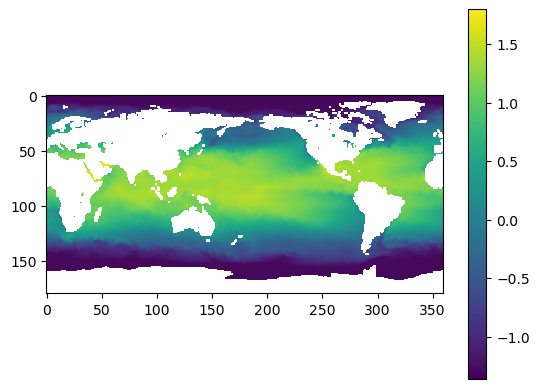

In [15]:
plt.imshow(trainer.util.normalise(data[step][0][0,0,0]))
plt.colorbar()

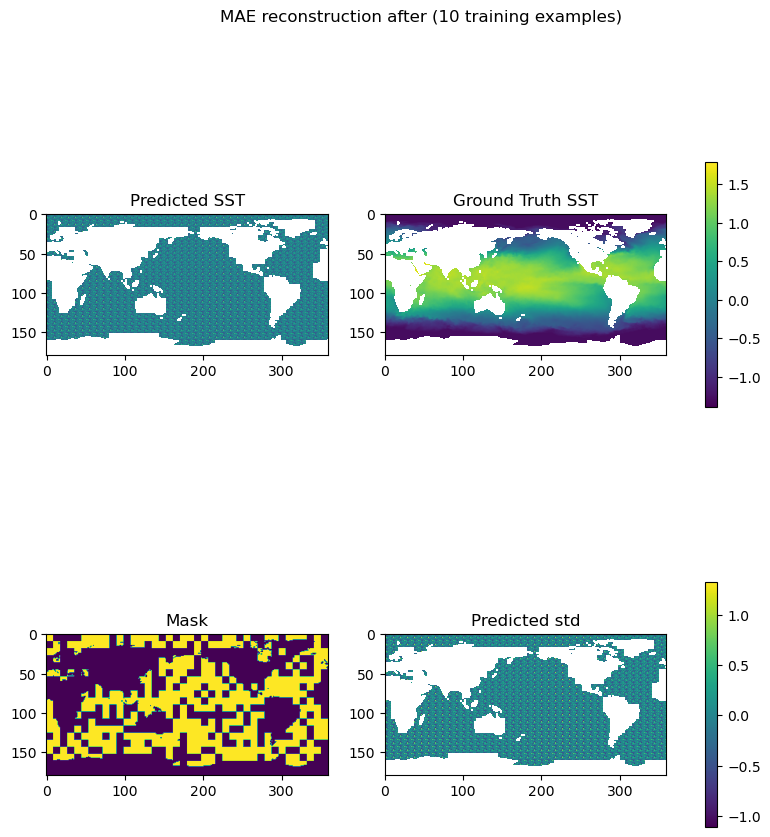

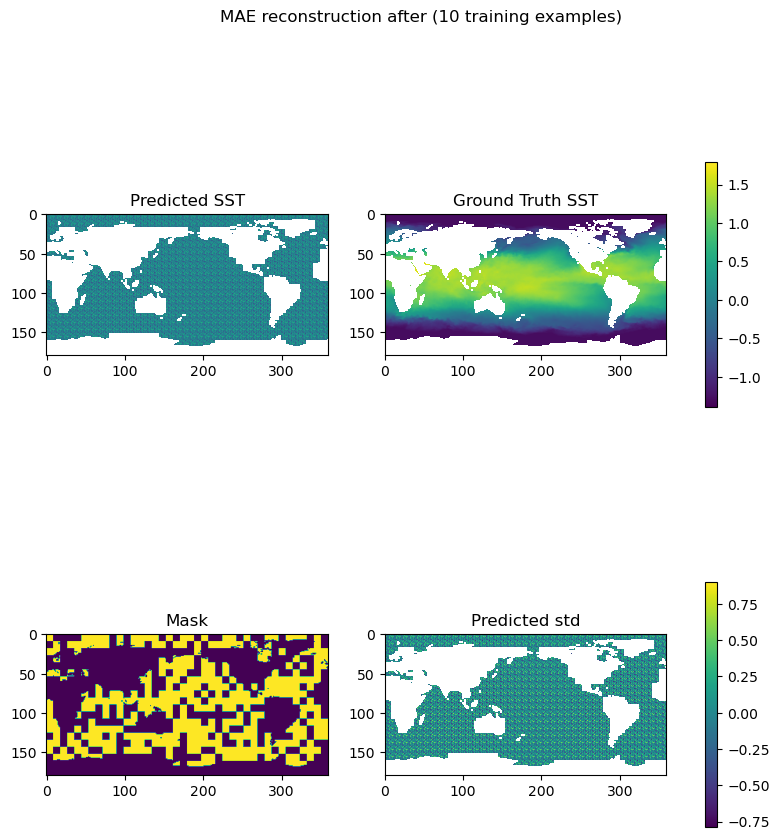

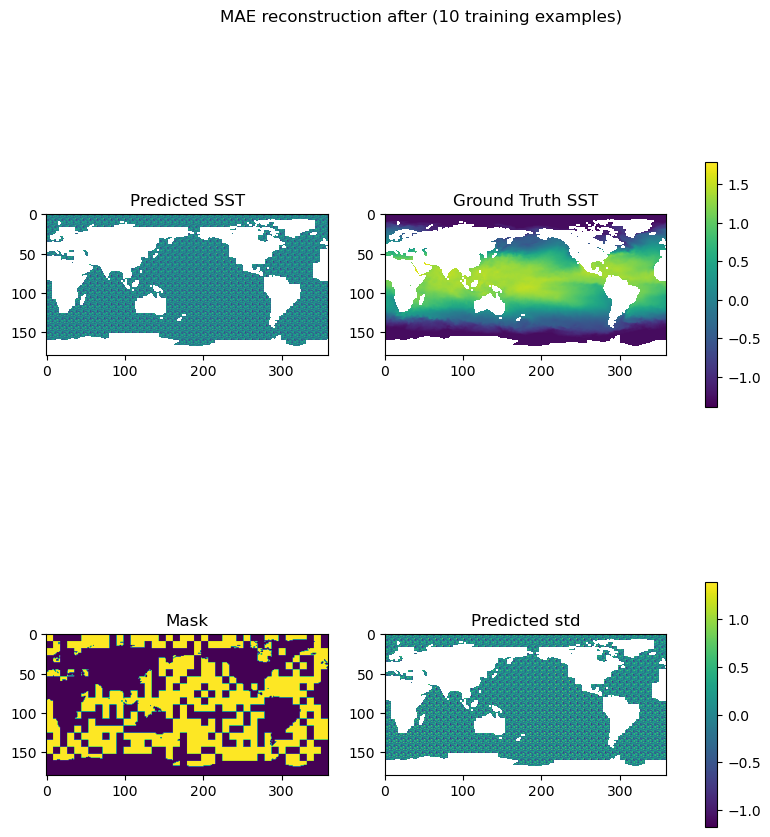

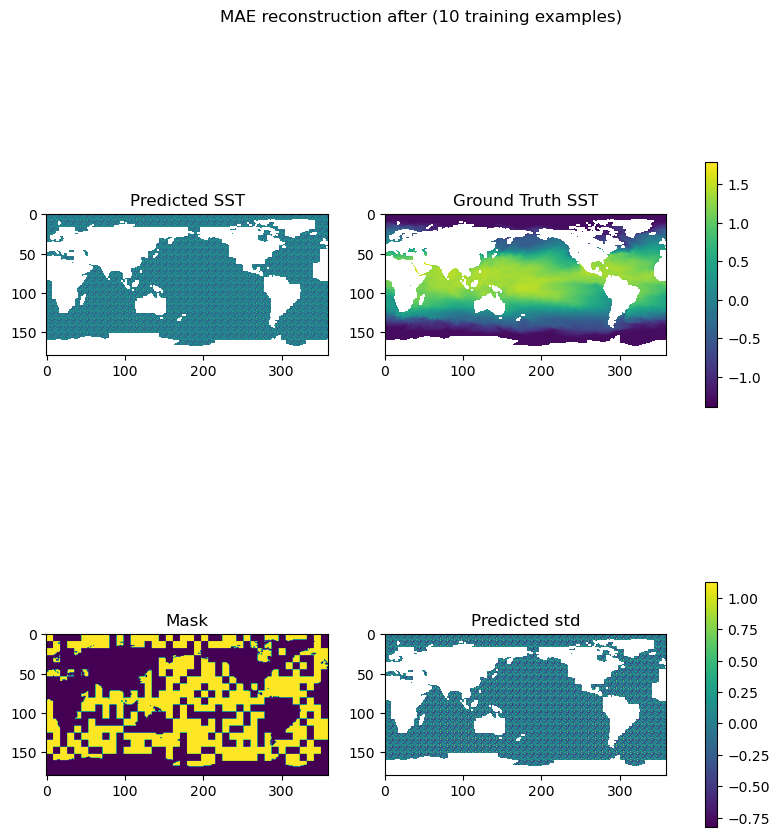

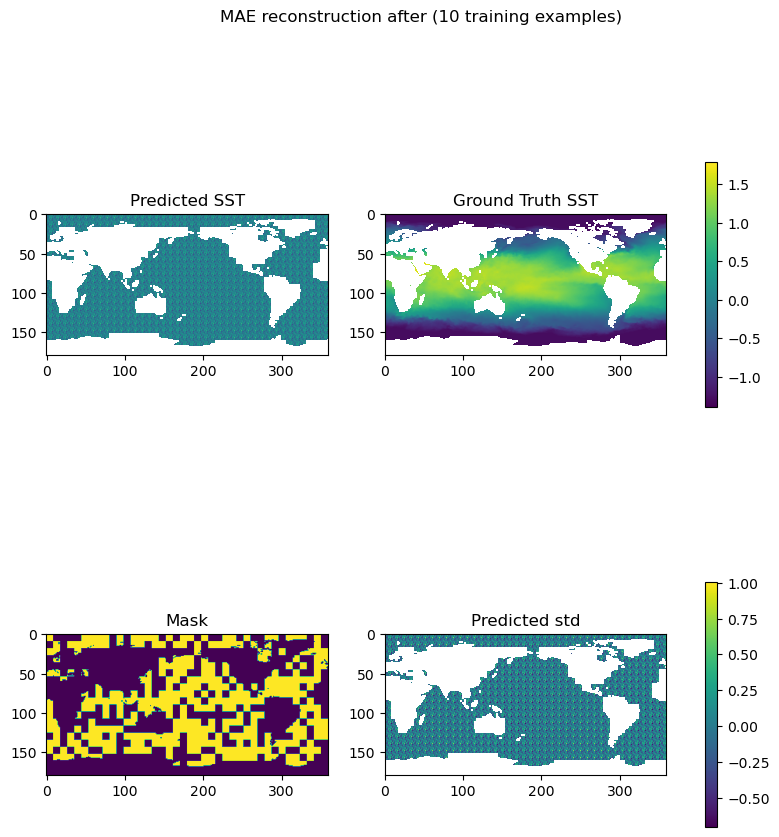

...

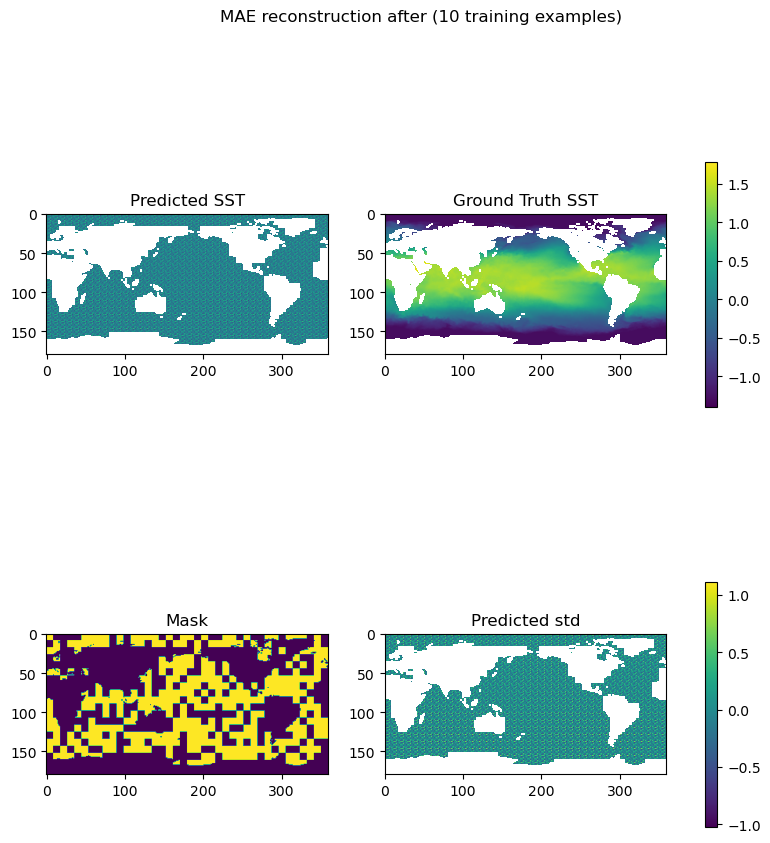

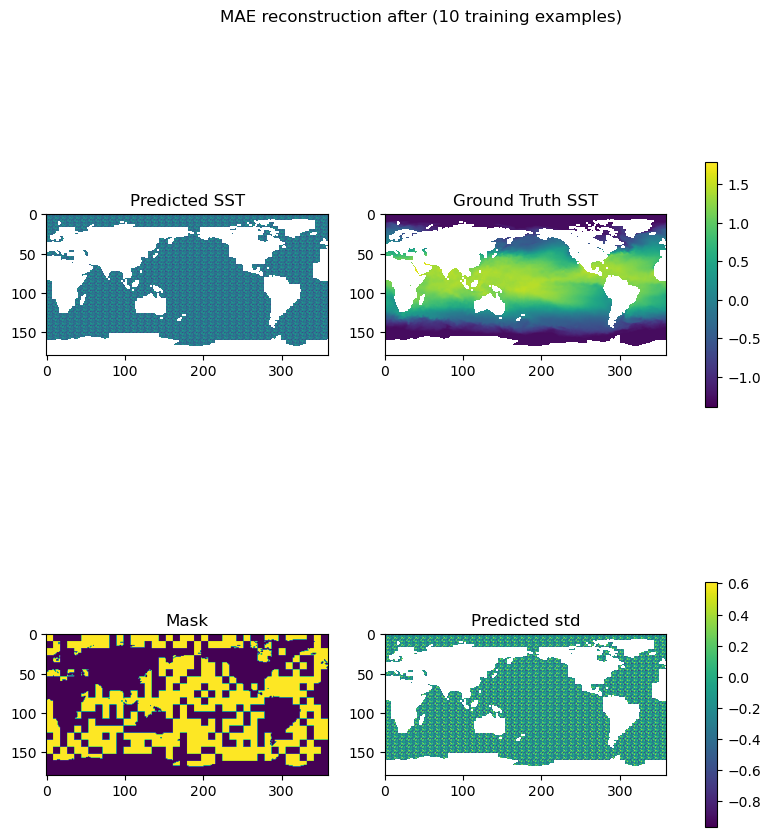

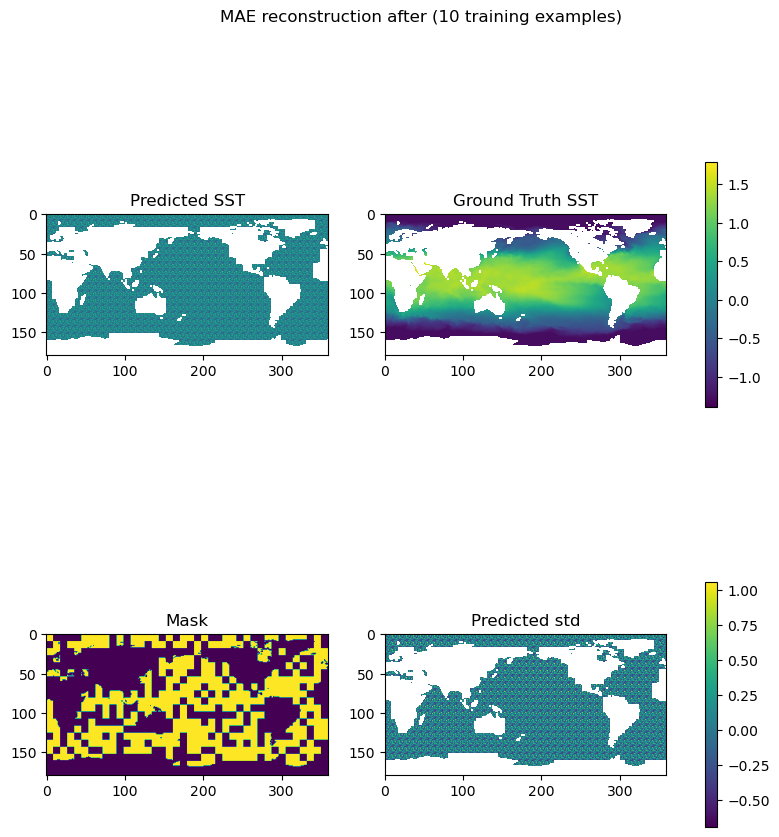

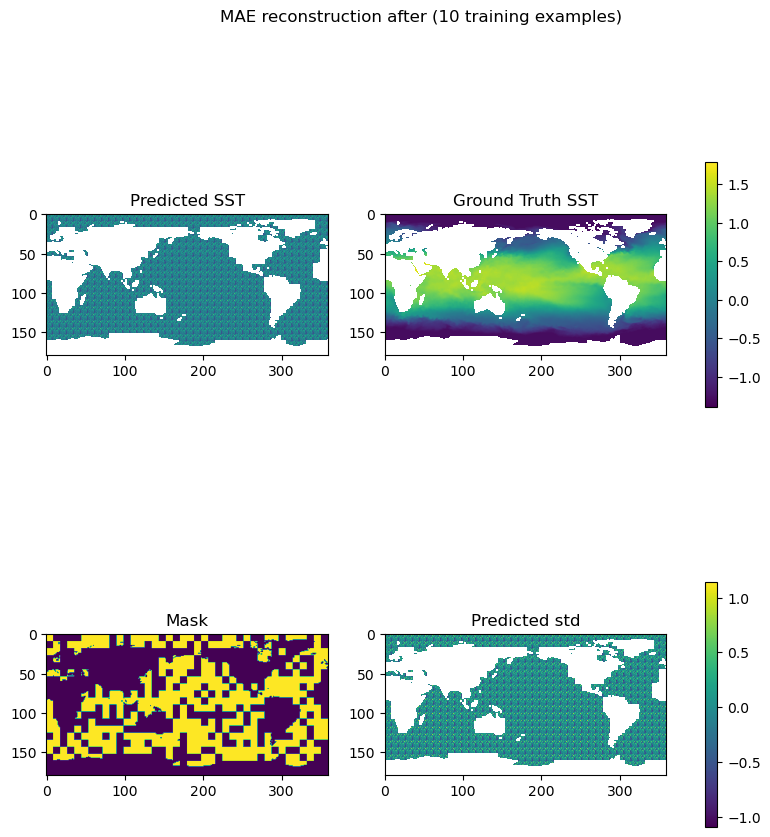

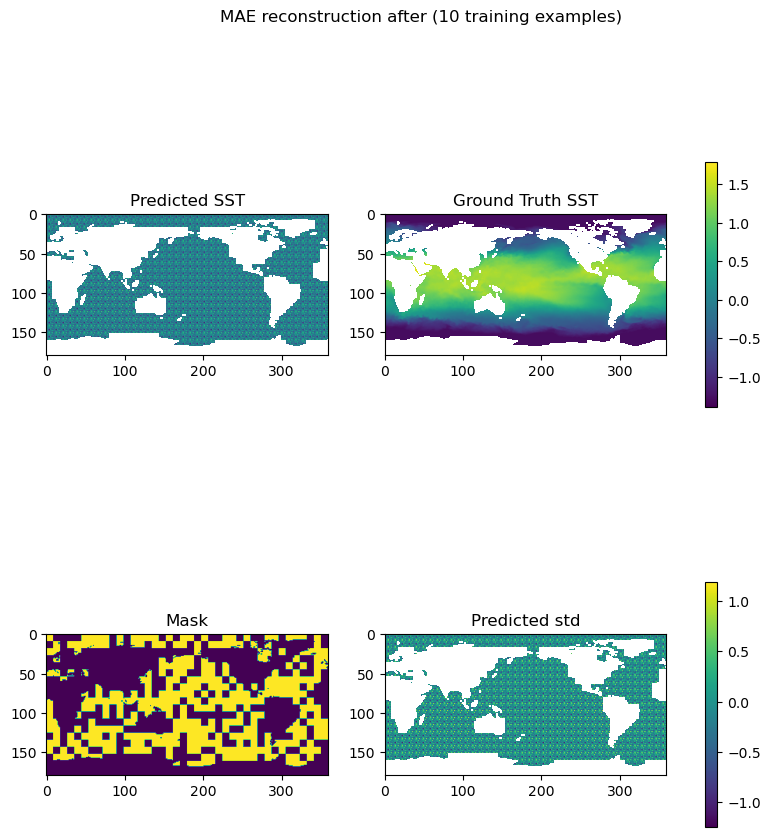

In [44]:
plot(outputs, data_norm, "10","test")

In [6]:
(~np.isnan(outputs[0][0][0,0,0].cpu().numpy())).sum()

42667

In [16]:
(~np.isnan(gt[0,0,0].cpu().numpy())).sum()

0

In [17]:
(~np.isnan(data[step][0][0,0,0].cpu().numpy())).sum()

0